In [30]:
import pandas as pd
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import ParameterGrid
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator
from sklearn.dummy import DummyRegressor
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_scoreimport seaborn as sns

import matplotlib.pyplot as plt

import numpy as np
import csv
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from keras import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from keras.utils import plot_model


# Загрузка DataSet

In [6]:
df_1 = pd.read_excel('X_bp.xlsx.', index_col=0)
df_1

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [4]:
df_2 = pd.DataFrame(pd.read_excel('X_nup.xlsx', index_col=0))
df_2

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.000000,57.000000
1,0,4.000000,60.000000
2,0,4.000000,70.000000
3,0,5.000000,47.000000
4,0,5.000000,57.000000
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [7]:
df = pd.concat([df_1, df_2], join='inner', axis=1)
df.sample(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
646,4.455973,1923.506618,809.888311,96.766048,26.521472,286.701065,690.360913,69.045798,2793.433343,180.068189,90,8.790863,70.645200
484,2.647706,1907.928883,441.695145,99.062352,22.283904,350.430937,317.094148,75.280332,2167.241512,143.135613,0,5.722829,63.183716
78,4.433176,1949.454587,638.939797,114.528376,25.798830,281.114391,293.444452,76.836063,2331.469527,147.007067,0,6.845036,49.753858
997,2.683784,1931.977478,807.326743,100.729284,22.561681,275.375287,765.460065,77.043898,3520.741857,137.055663,90,5.652525,53.622746
340,2.143969,1807.595910,361.022238,176.918846,22.959924,275.341718,122.478765,73.544720,2711.669582,239.185654,0,6.655858,62.395748


In [8]:
#описание датасета
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

In [9]:
# ищем пропуски
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [7]:
#Описательная статистика
df.describe()


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

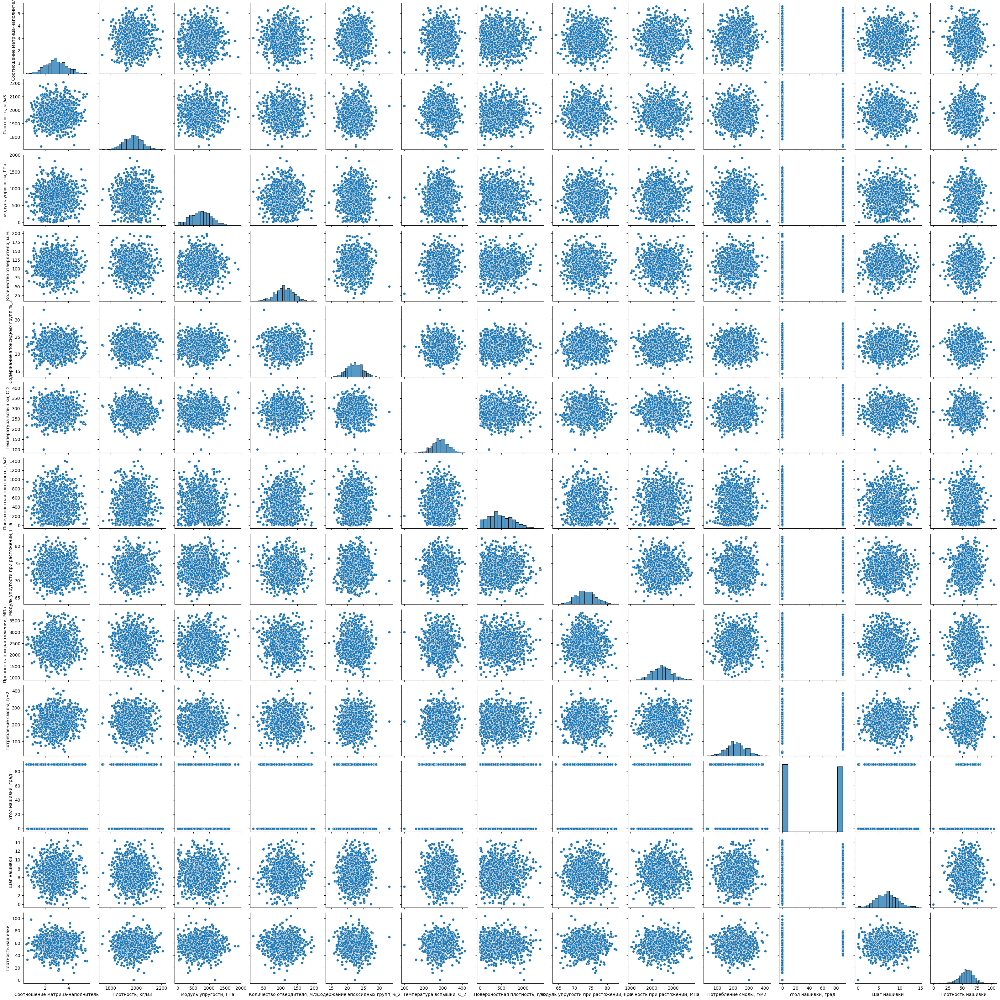

In [14]:
#Зависимость распределения параметров относительно друг друга
sns.pairplot(df)

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a futu

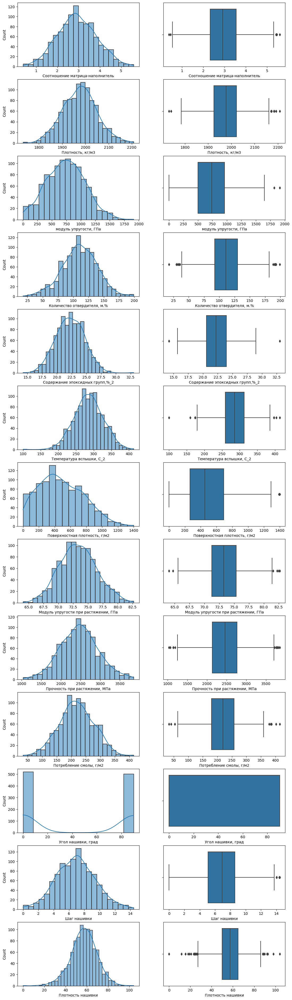

In [11]:
# Построю графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(df.columns):    
    sns.histplot(data=df, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df, x=column, ax=axes[k, 1])
plt.show()

In [10]:
import plotly.express as px
for col in df.columns: 
    fig = px.histogram(df, x=col, text_auto=True)
    fig.update_layout(title_text=f'Гистограмма для параметра: {col}',  
                        yaxis_title_text='Count', 
                        xaxis_title_text=f'{col}',
                        bargap=0.2, 
                        bargroupgap=0.1,
                        template="plotly_dark"
    )
    fig.show()

In [12]:
columns = df.columns.tolist()

In [13]:
# матрица корреляций
df_cor = df.corr()
df_cor

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.003841,0.031700,-0.006445,0.019766,-0.004776,-0.006272,-0.008411,0.024148,0.072531,-0.031073,0.036437,-0.004652
"Плотность, кг/м3",0.003841,1.000000,-0.009647,-0.035911,-0.008278,-0.020695,0.044930,-0.017602,-0.069981,-0.015937,-0.068474,-0.061015,0.080304
"модуль упругости, ГПа",0.031700,-0.009647,1.000000,0.024049,-0.006804,0.031174,-0.005306,0.023267,0.041868,0.001840,-0.025417,-0.009875,0.056346
"Количество отвердителя, м.%",-0.006445,-0.035911,0.024049,1.000000,-0.000684,0.095193,0.055198,-0.065929,-0.075375,0.007446,0.038570,0.014887,0.017248
"Содержание эпоксидных групп,%_2",0.019766,-0.008278,-0.006804,-0.000684,1.000000,-0.009769,-0.012940,0.056828,-0.023899,0.015165,0.008052,0.003022,-0.039073
"Температура вспышки, С_2",-0.004776,-0.020695,0.031174,0.095193,-0.009769,1.000000,0.020121,0.028414,-0.031763,0.059954,0.020695,0.025795,0.011391
"Поверхностная плотность, г/м2",-0.006272,0.044930,-0.005306,0.055198,-0.012940,0.020121,1.000000,0.036702,-0.003210,0.015692,0.052299,0.038332,-0.049923
"Модуль упругости при растяжении, ГПа",-0.008411,-0.017602,0.023267,-0.065929,0.056828,0.028414,0.036702,1.000000,-0.009009,0.050938,0.023003,-0.029468,0.006476
"Прочность при растяжении, МПа",0.024148,-0.069981,0.041868,-0.075375,-0.023899,-0.031763,-0.003210,-0.009009,1.000000,0.028602,0.023398,-0.059547,0.019604
"Потребление смолы, г/м2",0.072531,-0.015937,0.001840,0.007446,0.015165,0.059954,0.015692,0.050938,0.028602,1.000000,-0.015334,0.013394,0.012239


<Axes: >

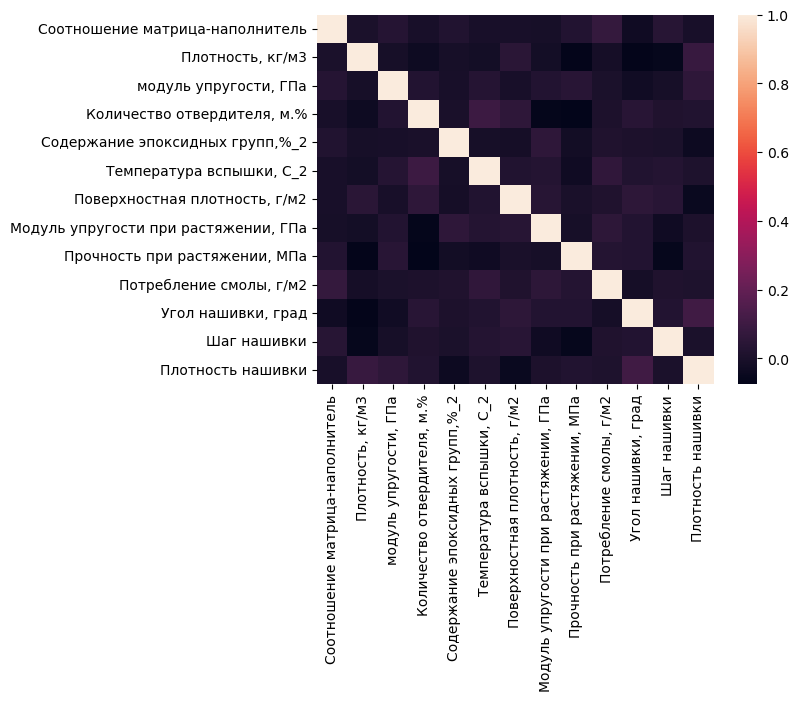

In [30]:
# тепловая карта
sns.heatmap(df_cor) 

In [6]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


# Удаление выбросов

In [14]:
for x in df.columns:
    q75,q25 = np.percentile(df.loc[:,x],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    df.loc[df[x] < min,x] = np.nan
    df.loc[df[x] > max,x] = np.nan

In [15]:
df = df.dropna(axis=0)

In [16]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,2.925683,1974.040023,738.247627,110.916216,22.209030,286.040414,482.993901,73.305127,2467.488822,217.613374,46.057692,6.915585,57.451895
std,0.893712,70.808120,328.708665,27.037891,2.394871,39.400677,280.190377,3.037381,463.838911,57.827255,45.011619,2.509672,11.239331
min,0.547391,1784.482245,2.436909,38.668500,15.695894,179.374391,0.603740,65.553336,1250.392802,63.685698,0.000000,0.037639,27.272928
25%,2.321931,1923.443748,498.577158,92.523816,20.571516,259.184486,266.004099,71.248823,2146.936034,179.489091,0.000000,5.134988,50.209656
50%,2.904731,1977.258043,738.736842,111.113175,22.184713,286.024118,457.732246,73.259230,2457.959767,218.388715,90.000000,6.943337,57.584225
75%,3.546650,2020.158764,958.418993,130.001450,23.961818,312.991425,695.900862,75.310788,2755.169485,256.396777,90.000000,8.591450,64.798211
max,5.314144,2161.565216,1649.415706,181.828448,28.955094,386.067992,1291.340115,81.417126,3705.672523,359.052220,90.000000,13.732404,86.012427


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    float64
 11  Шаг нашивки            

# Статистика призноков до и после стандартизации

In [546]:
#Описательная входных статистика до обработки
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,936.0,2.925683,0.893712,0.547391,2.321931,2.904731,3.546650,5.314144
"Плотность, кг/м3",936.0,1974.040023,70.808120,1784.482245,1923.443748,1977.258043,2020.158764,2161.565216
"модуль упругости, ГПа",936.0,738.247627,328.708665,2.436909,498.577158,738.736842,958.418993,1649.415706
"Количество отвердителя, м.%",936.0,110.916216,27.037891,38.668500,92.523816,111.113175,130.001450,181.828448
"Содержание эпоксидных групп,%_2",936.0,22.209030,2.394871,15.695894,20.571516,22.184713,23.961818,28.955094
"Температура вспышки, С_2",936.0,286.040414,39.400677,179.374391,259.184486,286.024118,312.991425,386.067992
"Поверхностная плотность, г/м2",936.0,482.993901,280.190377,0.603740,266.004099,457.732246,695.900862,1291.340115
"Модуль упругости при растяжении, ГПа",936.0,73.305127,3.037381,65.553336,71.248823,73.259230,75.310788,81.417126
"Прочность при растяжении, МПа",936.0,2467.488822,463.838911,1250.392802,2146.936034,2457.959767,2755.169485,3705.672523
"Потребление смолы, г/м2",936.0,217.613374,57.827255,63.685698,179.489091,218.388715,256.396777,359.052220


In [18]:
#Описательная статистика входных после обработки
df_scaled = pd.DataFrame(StandardScaler().fit_transform(df),columns = df.columns)
df_scaled.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,936.0,-3.985416e-16,1.000535,-2.662564,-0.675917,-0.023457,0.695189,2.673947
"Плотность, кг/м3",936.0,-1.040004e-15,1.000535,-2.678494,-0.714937,0.045471,0.651668,2.649773
"модуль упругости, ГПа",936.0,1.480297e-16,1.000535,-2.239686,-0.729517,0.001489,0.670165,2.773444
"Количество отвердителя, м.%",936.0,-4.934325e-17,1.000535,-2.673520,-0.680609,0.007288,0.706247,2.624101
"Содержание эпоксидных групп,%_2",936.0,-8.264994e-16,1.000535,-2.721073,-0.684125,-0.010160,0.732284,2.818386
"Температура вспышки, С_2",936.0,2.827748e-16,1.000535,-2.708660,-0.681975,-0.000414,0.684390,2.540085
"Поверхностная плотность, г/м2",936.0,1.537232e-16,1.000535,-1.722572,-0.774851,-0.090207,0.760272,2.886532
"Модуль упругости при растяжении, ГПа",936.0,-4.531987e-15,1.000535,-2.553495,-0.677361,-0.015119,0.660679,2.672150
"Прочность при растяжении, МПа",936.0,7.591269e-16,1.000535,-2.625366,-0.691456,-0.020555,0.620548,2.670853
"Потребление смолы, г/м2",936.0,-1.622634e-16,1.000535,-2.663276,-0.659631,0.013415,0.671035,2.447193


C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Alex\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a futu

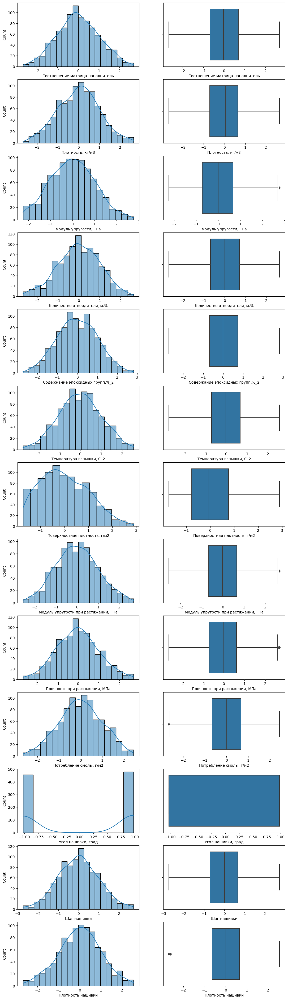

In [19]:
#графики распределения после стандартизации
fig, axes = plt.subplots(13, 2, figsize=(13, 48))
for k, column in enumerate(df.columns):    
    sns.histplot(data=df_scaled, x=column, kde=True, ax=axes[k, 0])
    sns.boxplot(data=df_scaled, x=column, ax=axes[k, 1])
plt.show()

# ML

Разбиваем данные на обучающую и тестовую выборки

In [21]:
X = df.drop(columns = ['Модуль упругости при растяжении, ГПа','Прочность при растяжении, МПа',])
y1 = df['Прочность при растяжении, МПа']
y2 = df['Модуль упругости при растяжении, ГПа']

X_train, X_test, y1_train, y1_test, y2_train, y2_test = train_test_split(X, y1, y2, test_size=0.3, random_state=42)

In [22]:

print('X_train:', X_train.shape, 'y1_train:', y1_train.shape)
print('x1_test:', X_test.shape, 'y1_test:', y1_test.shape)

X_train: (655, 11) y1_train: (655, 1)
x1_test: (281, 11) y1_test: (281, 1)


In [88]:
y1_p = pd.DataFrame(y1)
y1_p.describe()

,"Прочность при растяжении, МПа"
count,936.000000
mean,2467.488822
std,463.838911
min,1250.392802
25%,2146.936034
50%,2457.959767
75%,2755.169485
max,3705.672523


In [89]:
y2_p = pd.DataFrame(y2)
y2_p.describe()

,"Модуль упругости при растяжении, ГПа"
count,936.000000
mean,73.305127
std,3.037381
min,65.553336
25%,71.248823
50%,73.259230
75%,75.310788
max,81.417126


# Дамми регрессор на среднее!

Прочность при растяжении

In [25]:
models_pr = pd.DataFrame()

In [26]:
models_upr = pd.DataFrame()

In [27]:
from sklearn.dummy import DummyRegressor

dummy_regr = DummyRegressor(strategy="mean")
dummy_regr.fit(X_train, y1_train)

DummyRegressor()

In [31]:
dummy_st_result = pd.DataFrame({
   'Model': 'DummyRegressor',
   'MSE' : mean_squared_error(y1_test, dummy_regr.predict(X_test)),
   'MAE': mean_absolute_error(y1_test,dummy_regr.predict(X_test) ), 
   'R2 score': r2_score(y1_test,dummy_regr.predict(X_test)).round(3)
}, index=['Прочность при растяжении, МПа'])

In [233]:
dummy_st_result

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",DummyRegressor,210162.56563,360.306251,-0.03


In [32]:
models_pr = pd.concat([models_pr, dummy_st_result])

Модуль упругости при растяжении

In [34]:
dummy_regr_2 = DummyRegressor(strategy="mean")
dummy_regr_2.fit(X_train, y2_train)

DummyRegressor()

In [36]:
dummy_m_result = pd.DataFrame({
   'Model': 'DummyRegressor',
   'MSE' : mean_squared_error(y2_test, dummy_regr_2.predict(X_test)),
   'MAE': mean_absolute_error(y2_test,dummy_regr_2.predict(X_test) ), 
   'R2 score': r2_score(y2_test,dummy_regr_2.predict(X_test)).round(3)
}, index=['Модуль упругости при растяжении, ГПа'])

In [37]:
dummy_m_result

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжении, ГПа",DummyRegressor,8.765902,2.398634,-0.006


In [38]:
models_upr = pd.concat([models_upr, dummy_m_result])

# Линейная модель

pipline для Прочность при растяжении, МПа

In [39]:
# pipeline включаем стандартизацию
pipeline_linear = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression()) 
])

pipeline_linear.fit(X_train, y1_train)


mean_squared_error(y1_test, pipeline_linear.predict(X_test))

213381.58413414136

In [40]:
line_st_result = pd.DataFrame({
   'Model': 'LinearRegression',
   'MSE' : mean_squared_error(y1_test, pipeline_linear.predict(X_test)),
   'MAE': mean_absolute_error(y1_test, pipeline_linear.predict(X_test)), 
   'R2 score': pipeline_linear.score(X_test, y1_test).round(3)
}, index=['Прочность при растяжении, МПа'])

In [41]:
from sklearn.metrics import r2_score

In [42]:
line_st_result

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",LinearRegression,213381.584134,362.854584,-0.045


In [43]:
models_pr = pd.concat([models_pr, line_st_result])

pipeline для Модуль упругости при растяжении, ГПа

In [44]:
pipeline_linear_2 = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression()) 
])

pipeline_linear_2.fit(X_train, y2_train)


mean_squared_error(y2_test, pipeline_linear_2.predict(X_test))

8.745601817205982

In [45]:
line_m_result = pd.DataFrame({
   'Model': 'LinearRegression',
   'MSE' : mean_squared_error(y2_test, pipeline_linear_2.predict(X_test)),
   'MAE': mean_absolute_error(y2_test, pipeline_linear_2.predict(X_test)), 
   'R2 score': pipeline_linear_2.score(X_test, y2_test).round(3)
}, index=['Модуль упругости при растяжении, ГПа'])

In [46]:
line_m_result

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжении, ГПа",LinearRegression,8.745602,2.416002,-0.004


In [47]:
models_upr = pd.concat([models_upr, line_m_result])

# Ridge

pipline для Прочность при растяжении, МПа

In [48]:
pipeline_linear_r = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('regressor', Ridge()) 
])
# используем GridSearchCV для поиска гипер
param_grid = {'regressor__alpha': [0, 0.01, 0.1, 1.0, 10.0, 100]}

grid_search = GridSearchCV(pipeline_linear_r, param_grid, cv=10, scoring='neg_mean_squared_error')

grid_search.fit(X_train, y1_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('regressor', Ridge())]),
             param_grid={'regressor__alpha': [0, 0.01, 0.1, 1.0, 10.0, 100]},
             scoring='neg_mean_squared_error')

In [48]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'regressor__alpha': 100}
-222823.43713730137


In [49]:
line_r_st_result = pd.DataFrame({
   'Model': 'Rige',
   'MSE' : mean_squared_error(y1_test, grid_search.predict(X_test)),
   'MAE': mean_absolute_error(y1_test, grid_search.predict(X_test)), 
   'R2 score': r2_score(y1_test, grid_search.predict(X_test)).round(3)
}, index=['Прочность при растяжении, МПа'])

In [50]:
line_r_st_result

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",Rige,212349.035083,361.903011,-0.04


In [51]:
models_pr = pd.concat([models_pr, line_r_st_result])

pipeline для Модуль упругости при растяжении, ГПа

In [52]:
pipeline_linear_r2 = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('regressor', Ridge()) 
])

param_grid_r2 = {'regressor__alpha': [0, 0.01, 0.1, 1.0, 10.0, 100]}

grid_search_r2 = GridSearchCV(pipeline_linear_r2, param_grid_r2, cv=10, scoring='neg_mean_squared_error')

grid_search_r2.fit(X_train, y2_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('regressor', Ridge())]),
             param_grid={'regressor__alpha': [0, 0.01, 0.1, 1.0, 10.0, 100]},
             scoring='neg_mean_squared_error')

In [53]:
line_r_m_result = pd.DataFrame({
   'Model': 'Rige',
   'MSE' : mean_squared_error(y2_test, grid_search_r2.best_estimator_.predict(X_test)),
   'MAE': mean_absolute_error(y2_test, grid_search_r2.best_estimator_.predict(X_test)), 
   'R2 score':r2_score(y2_test, grid_search_r2.best_estimator_.predict(X_test) ).round(3)
}, index=['Модуль упругости при растяжение, ГПа'])

In [54]:
line_r_m_result

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжение, ГПа",Rige,8.732845,2.412596,-0.002


In [57]:
models_upr = pd.concat([models_upr, line_r_m_result])

# Random forest

pipline для Прочность при растяжении, МПа

In [59]:
pipeline_rf = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor()) 
])

param_grid = {'regressor__n_estimators': [100, 500, 1000],
              'regressor__max_depth': [3,5,7,9,11,13,20,30,40]}

grid_search = GridSearchCV(pipeline_rf, param_grid, cv=10, scoring='neg_mean_squared_error')

grid_search.fit(X_train, y1_train)
mean_squared_error(y1_test, grid_search.best_estimator_.predict(X_test))

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Alex\anaconda3\Lib\site-packages\sklearn\pipeline.py:405: DataConversionWarning:

A column-vect

213095.9007479741

In [60]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'regressor__max_depth': 3, 'regressor__n_estimators': 100}
-220825.36830233043


In [61]:
mean_squared_error(y1_test, grid_search.best_estimator_.predict(X_test))

213095.9007479741

In [62]:
rf_st_result = pd.DataFrame({
   'Model': 'RandomForestRegressor',
   'MSE' : mean_squared_error(y1_test, grid_search.predict(X_test)),
   'MAE': mean_absolute_error(y1_test, grid_search.predict(X_test)), 
   'R2 score': r2_score(y1_test,grid_search.predict(X_test)).round(3)
}, index=['Прочность при растяжении, МПа'])

In [63]:
rf_st_result

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",RandomForestRegressor,213095.900748,363.937704,-0.044


In [64]:
models_pr = pd.concat([models_pr, rf_st_result])

pipeline для Модуль упругости при растяжении, ГПа

In [66]:
pipeline_rf_1 = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor()) 
])

param_grid_1 = {'regressor__n_estimators': [100, 500, 1000],
              'regressor__max_depth': [3,5,7,9,11,13,20,30,40]}

grid_search_1 = GridSearchCV(pipeline_rf_1, param_grid_1, cv=10, scoring='neg_mean_squared_error')

grid_search_1.fit(X_train, y2_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('regressor', RandomForestRegressor())]),
             param_grid={'regressor__max_depth': [3, 5, 7, 9, 11, 13, 20, 30,
                                                  40],
                         'regressor__n_estimators': [100, 500, 1000]},
             scoring='neg_mean_squared_error')

In [67]:
mean_squared_error(y2_test, grid_search_1.best_estimator_.predict(X_test))

8.735981417382087

In [71]:
rf_m_result = pd.DataFrame({
   'Model': 'RandomForestRegressor',
   'MSE' : mean_squared_error(y2_test, grid_search_1.predict(X_test)),
   'MAE': mean_absolute_error(y2_test, grid_search_1.predict(X_test)), 
   'R2 score': r2_score(y2_test, grid_search_1.predict(X_test)).round(3)
}, index=['Модуль упругости при растяжение, ГПа'])

In [72]:
rf_m_result 

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжение, ГПа",RandomForestRegressor,8.735981,2.404383,-0.002


In [73]:
models_upr = pd.concat([models_upr, rf_m_result])

# KNN

pipline для Прочность при растяжении, МПа

In [66]:
from sklearn.preprocessing import MinMaxScaler

In [69]:
pipeline_knn = Pipeline(steps=[
    ('scaler', MinMaxScaler()),
    ('regressor', KNeighborsRegressor(n_neighbors=177)) 
])

pipeline_knn.fit(X_train, y1_train)


mean_squared_error(y1_test, pipeline_knn.predict(X_test))

209750.48952639927

In [70]:
param_grid_knn_1 = {'regressor__n_neighbors': [2, 4, 5, 6, 8, 10, 15, 20, 25, 30 ,35, 40, 50, 60, 70, 80, 90, 100, 177]}

# Создание GridSearchCV объекта с пайплайном и параметрами для перебора
grid_search_knn_1 = GridSearchCV(pipeline_knn, param_grid_knn_1, cv=5, scoring='neg_mean_squared_error')

# Обучение GridSearchCV на данных
grid_search_knn_1.fit(X_train, y1_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('regressor',
                                        KNeighborsRegressor(n_neighbors=177))]),
             param_grid={'regressor__n_neighbors': [2, 4, 5, 6, 8, 10, 15, 20,
                                                    25, 30, 35, 40, 50, 60, 70,
                                                    80, 90, 100, 177]},
             scoring='neg_mean_squared_error')

In [71]:
print(grid_search_knn_1.best_params_)
print(grid_search_knn_1.best_score_)

{'regressor__n_neighbors': 177}
-221368.39428713248


In [74]:
knn_st_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor',
   'MSE' : mean_squared_error(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)),
   'MAE': mean_absolute_error(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)), 
   'R2 score': r2_score(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)).round(3)
}, index=['Прочность при растяжении, МПа'])

In [75]:
knn_st_result

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",KNeighborsRegressor,209750.489526,360.097838,-0.028


In [78]:
models_pr = pd.concat([models_pr, knn_st_result])

pipeline для Модуль упругости при растяжении, ГПа

In [83]:
pipeline_knn_2 = Pipeline(steps=[
    ('scaler', MinMaxScaler()),
    ('regressor', KNeighborsRegressor(n_neighbors=170)) 
])

pipeline_knn_2.fit(X_train, y2_train)


mean_squared_error(y2_test, pipeline_knn_2.predict(X_test))

8.67870376977968

In [84]:
# Определение сетки значений для перебора
param_grid_knn_2 = {'regressor__n_neighbors': [2, 4, 5, 6, 8, 10, 15, 20, 25, 30 ,35, 40, 50, 60, 70, 80, 90, 100, 150 , 170, 200]}

# Создание GridSearchCV объекта с пайплайном и параметрами для перебора
grid_search_knn_2 = GridSearchCV(pipeline_knn_2, param_grid_knn_2, cv=5, scoring='neg_mean_squared_error')

# Обучение GridSearchCV на данных
grid_search_knn_2.fit(X_train, y2_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('regressor',
                                        KNeighborsRegressor(n_neighbors=170))]),
             param_grid={'regressor__n_neighbors': [2, 4, 5, 6, 8, 10, 15, 20,
                                                    25, 30, 35, 40, 50, 60, 70,
                                                    80, 90, 100, 150, 170,
                                                    200]},
             scoring='neg_mean_squared_error')

In [85]:
print(grid_search_knn_2.best_params_)
print(grid_search_knn_2.best_score_)

{'regressor__n_neighbors': 170}
-9.471108367432295


In [86]:
knn_m_result = pd.DataFrame({
   'Model': 'KNeighborsRegressor',
   'MSE' : mean_squared_error(y2_test, grid_search_knn_2.best_estimator_.predict(X_test)),
   'MAE': mean_absolute_error(y2_test, grid_search_knn_2.best_estimator_.predict(X_test)), 
   'R2 score': r2_score(y2_test, grid_search_knn_2.best_estimator_.predict(X_test)).round(3)
}, index=['Модуль упругости при растяжение, ГПа'])

In [87]:
knn_m_result

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжение, ГПа",KNeighborsRegressor,8.678704,2.392482,0.004


In [88]:
models_upr = pd.concat([models_upr, knn_m_result])

# Метрики  моделей

In [90]:
models_sort_upr = models_upr.sort_values(by=['MAE', 'R2 score'])
models_sort_upr

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжение, ГПа",KNeighborsRegressor,8.678704,2.392482,0.004
"Модуль упругости при растяжении, ГПа",DummyRegressor,8.765902,2.398634,-0.006
"Модуль упругости при растяжение, ГПа",Rige,8.732845,2.412596,-0.002
"Модуль упругости при растяжение, ГПа",Rige,8.732845,2.412596,-0.002
"Модуль упругости при растяжении, ГПа",LinearRegression,8.745602,2.416002,-0.004


In [91]:
models_sort_pr = models_pr.sort_values(by=['MAE', 'R2 score'])
models_sort_pr

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",KNeighborsRegressor,209750.489526,360.097838,-0.028
"Прочность при растяжении, МПа",DummyRegressor,210162.565630,360.306251,-0.030
"Прочность при растяжении, МПа",Rige,212349.035083,361.903011,-0.040
"Прочность при растяжении, МПа",LinearRegression,213381.584134,362.854584,-0.045
"Прочность при растяжении, МПа",RandomForestRegressor,213095.900748,363.937704,-0.044


Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа')

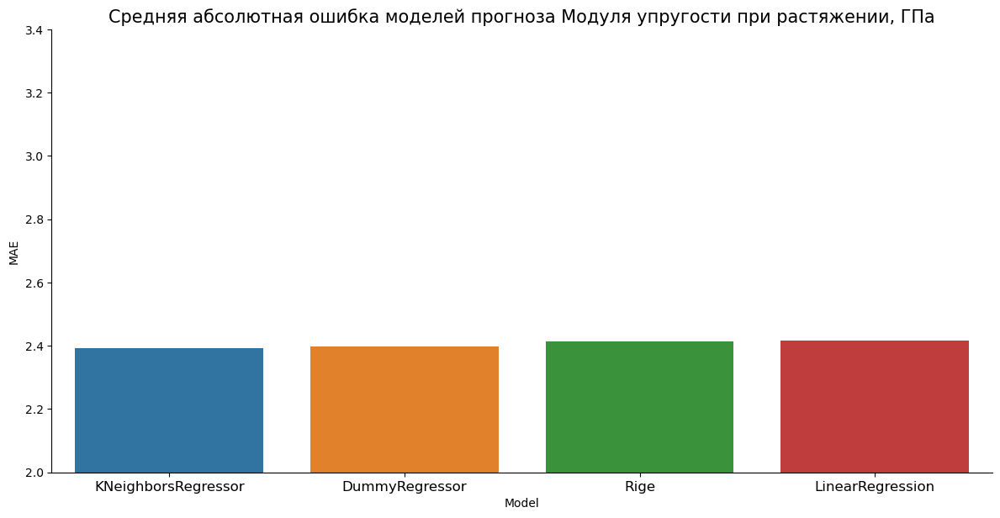

In [93]:
#Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении
sns.catplot(data=models_sort_upr, x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=2, ymax=3.4)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Модуля упругости при растяжении, ГПа', size=15)

Text(0.5, 1.0, 'Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа')

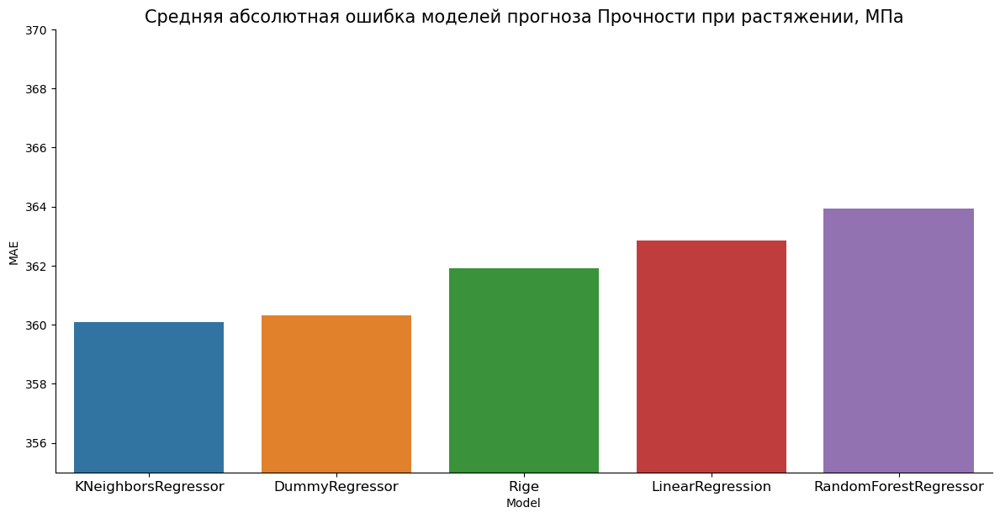

In [94]:
sns.catplot(data=models_sort_pr, x='Model', y='MAE', kind='bar', height=6, aspect=2)
plt.ylim(ymin=355, ymax=370)
plt.xticks(size=12)
plt.title('Средняя абсолютная ошибка моделей прогноза Прочности при растяжении, МПа', size=15)

# Сравнение лучшей модели с базовой

Модуль упругости при растяжение, ГПа

In [95]:
base = pd.DataFrame({
   'Model': 'DummyRegressor',
   'MSE' : mean_squared_error(y2_test, dummy_regr_2.predict(X_test)),
   'MAE': mean_absolute_error(y2_test,dummy_regr_2.predict(X_test) ), 
   'R2 score': r2_score(y2_test,dummy_regr_2.predict(X_test)).round(3)
}, index=['Модуль упругости при растяжении, ГПа'])

In [96]:
best = pd.DataFrame({
   'Model': 'KNeighborsRegressor',
   'MSE' : mean_squared_error(y2_test, pipeline_knn_2.predict(X_test)),
   'MAE': mean_absolute_error(y2_test, pipeline_knn_2.predict(X_test)), 
   'R2 score': r2_score(y2_test, pipeline_knn_2.predict(X_test)).round(5)
}, index=['Модуль упругости при растяжение, ГПа'])

In [97]:
best_m = pd.DataFrame()

In [98]:
best_m = pd.concat([best_m, base])

In [99]:
best_m = pd.concat([best_m, best])
best_m

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжении, ГПа",DummyRegressor,8.765902,2.398634,-0.00600
"Модуль упругости при растяжение, ГПа",KNeighborsRegressor,8.678704,2.392482,0.00408


Прочность при растяжении, МПа

In [115]:
best_pr_ = pd.DataFrame()


In [116]:
base_1 = pd.DataFrame({
   'Model': 'DummyRegressor',
   'MSE' : mean_squared_error(y1_test, dummy_regr.predict(X_test)),
   'MAE': mean_absolute_error(y1_test,dummy_regr.predict(X_test) ), 
   'R2 score': r2_score(y1_test,dummy_regr.predict(X_test)).round(3)
}, index=['Прочность при растяжении, МПа'])

In [117]:
best_1 = pd.DataFrame({
   'Model': 'KNeighborsRegressor',
   'MSE' : mean_squared_error(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)),
   'MAE': mean_absolute_error(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)), 
   'R2 score': r2_score(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)).round(3)
}, index=['Прочность при растяжении, МПа'])

In [118]:
best_pr_ = pd.concat([best_pr_, base_1])

In [119]:
best_pr_ = pd.concat([best_pr_, best_1])


In [121]:
best_pr_

,Model,MSE,MAE,R2 score
"Прочность при растяжении, МПа",DummyRegressor,210162.565630,360.306251,-0.030
"Прочность при растяжении, МПа",KNeighborsRegressor,209750.489526,360.097838,-0.028


# Сравнение ошибок на test и train

Прочность при растяжении

In [122]:
train_1 = pd.DataFrame({
   'Model': 'KNeighborsRegressor_train',
   'MSE' : mean_squared_error(y1_train,  grid_search_knn_1.best_estimator_.predict(X_train)),
   'MAE': mean_absolute_error(y1_train,  grid_search_knn_1.best_estimator_.predict(X_train)), 
   'R2 score': r2_score(y1_train, grid_search_knn_1.best_estimator_.predict(X_train)).round(3)
}, index=['Прочность при растяжении, Train'])

In [123]:
best_t = pd.DataFrame({
   'Model': 'KNeighborsRegressor_test',
   'MSE' : mean_squared_error(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)),
   'MAE': mean_absolute_error(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)), 
   'R2 score': r2_score(y1_test, grid_search_knn_1.best_estimator_.predict(X_test)).round(3)
}, index=['Прочность при растяжении, Test'])

In [124]:
train_ = pd.DataFrame()

In [125]:
train_ = pd.concat([train_, train_1])


In [126]:
train_ = pd.concat([train_, best_t])

In [127]:
train_

,Model,MSE,MAE,R2 score
"Прочность при растяжении, Train",KNeighborsRegressor_train,215666.156117,371.301244,0.010
"Прочность при растяжении, Test",KNeighborsRegressor_test,209750.489526,360.097838,-0.028


Модуль упругости при растяжение

In [129]:
train_2 = pd.DataFrame({
   'Model': 'KNeighborsRegressor_train',
   'MSE' : mean_squared_error(y2_train,grid_search_knn_2.best_estimator_.predict(X_train)),
   'MAE': mean_absolute_error(y2_train, grid_search_knn_2.best_estimator_.predict(X_train)), 
   'R2 score': r2_score(y2_train, grid_search_knn_2.best_estimator_.predict(X_train) ).round(3)
}, index=['Модуль упругости при растяжение, Train'])

In [130]:
best_t_1 = pd.DataFrame({
   'Model': 'KNeighborsRegressor test',
   'MSE' : mean_squared_error(y2_test, grid_search_knn_2.best_estimator_.predict(X_test)),
   'MAE': mean_absolute_error(y2_test, grid_search_knn_2.best_estimator_.predict(X_test)), 
   'R2 score': r2_score(y2_test, grid_search_knn_2.best_estimator_.predict(X_test)).round(3)
}, index=['Модуль упругости при растяжение, Test'])

In [131]:
train_1 = pd.DataFrame()

In [132]:
train_1 = pd.concat([train_1, train_2])


In [133]:
train_1= pd.concat([train_1, best_t_1])

In [134]:
train_1

,Model,MSE,MAE,R2 score
"Модуль упругости при растяжение, Train",KNeighborsRegressor_train,9.352287,2.466896,0.007
"Модуль упругости при растяжение, Test",KNeighborsRegressor test,8.678704,2.392482,0.004


# Нейронная сеть

In [340]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    float64
 11  Шаг нашивки            

In [135]:
X_1 = df.drop(columns = ['Соотношение матрица-наполнитель'])

y_3 = df['Соотношение матрица-наполнитель']

X_1_train, X_1_test, y_3_train, y_3_test = train_test_split(X_1, y_3, test_size=0.3, random_state=42)

In [136]:
y3_p = pd.DataFrame(y_3)
y3_p.describe()

,Соотношение матрица-наполнитель
count,936.000000
mean,2.925683
std,0.893712
min,0.547391
25%,2.321931
50%,2.904731
75%,3.546650
max,5.314144


In [96]:

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM
from keras.callbacks import EarlyStopping, ModelCheckpoint


In [137]:
# базовая модель
dummy_regr = DummyRegressor(strategy="mean")
dummy_regr.fit(X_1_train, y_3_train)

DummyRegressor()

In [138]:
dummy_mn_result = pd.DataFrame({
   'Model': 'DummyRegressor',
   'MSE' : mean_squared_error(y_3_test, dummy_regr.predict(X_1_test)),
   'MAE': mean_absolute_error(y_3_test,dummy_regr.predict(X_1_test) ), 
   'R2 score': r2_score(y_3_test,dummy_regr.predict(X_1_test)).round(3)
}, index=['Матрица-наполнитель'])

In [139]:
dummy_mn_result

,Model,MSE,MAE,R2 score
Матрица-наполнитель,DummyRegressor,0.762885,0.694175,-0.002


In [140]:
import tensorflow as tf
from tensorflow.keras.models import Model # basic class for specifying and training a neural network
from tensorflow.keras.layers import Input, Dense # базовый класс для задания и обучения нейронной сети

from tensorflow.keras.optimizers import SGD
# from tensorflow.keras.activations import relu
from tensorflow.keras.layers import ReLU

In [141]:
normalizer = tf.keras.layers.Normalization(axis=-1)

In [142]:
X_train_mn_norm = normalizer.adapt(np.array(X_1_train))

In [147]:
from keras import Sequential
from keras.layers import Dense
from keras.callbacks import EarlyStopping
from keras.utils import plot_model
from tensorflow.keras.layers import Dense, BatchNormalization, LeakyReLU, Activation, Dropout, LSTM

In [148]:
model = Sequential(X_train_mn_norm)
model.add(Dense(12, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(4, activation='relu'))
model.add(BatchNormalization())
model.add(Dense(1))

#Компиляция
model.compile(optimizer='adam',loss='mse')
model.build((None, X_1.shape[1]))

#adam
#X_train_mn_norm
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 12)             │           156 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 12)             │            48 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │            52 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 4)              │            16 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 277 (1.08 KB)

 Trainable params: 245 (980.00 B)

 Non-trainable params: 32 (128.00 B)

In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 936 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       936 non-null    float64
 1   Плотность, кг/м3                      936 non-null    float64
 2   модуль упругости, ГПа                 936 non-null    float64
 3   Количество отвердителя, м.%           936 non-null    float64
 4   Содержание эпоксидных групп,%_2       936 non-null    float64
 5   Температура вспышки, С_2              936 non-null    float64
 6   Поверхностная плотность, г/м2         936 non-null    float64
 7   Модуль упругости при растяжении, ГПа  936 non-null    float64
 8   Прочность при растяжении, МПа         936 non-null    float64
 9   Потребление смолы, г/м2               936 non-null    float64
 10  Угол нашивки, град                    936 non-null    float64
 11  Шаг нашивки            

In [150]:
callback = EarlyStopping(monitor='loss',patience=10)

history = model.fit(X_1_train, y_3_train, validation_data = (X_1_test, y_3_test), batch_size=32, epochs=100, callbacks=[callback])

Epoch 1/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 9.8484 - val_loss: 9.9363
Epoch 2/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.3611 - val_loss: 9.1049
Epoch 3/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.9891 - val_loss: 8.1348
Epoch 4/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.5033 - val_loss: 7.4924
Epoch 5/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.2872 - val_loss: 6.9735
Epoch 6/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.8454 - val_loss: 6.7312
Epoch 7/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 7.9206 - val_loss: 6.4949
Epoch 8/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.4213 - val_loss: 6.3162
Epoch 9/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.7235 - val_loss: 5.8570
Epoch 10/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4394 - val_loss: 5.5157
Epoch 11/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1121 - val_loss: 5.1909
Epoch 12/100
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.8

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 625us/step


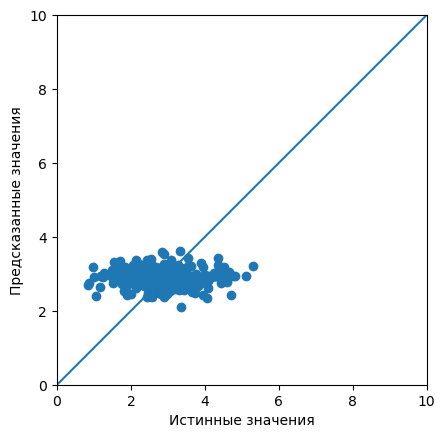

In [160]:
# Предсказание на тестовой
test_predictions = model.predict(X_1_test).flatten()

a = plt.axes(aspect='equal')
plt.scatter(y_3_test, test_predictions)
plt.xlabel('Истинные значения')
plt.ylabel('Предсказанные значения')
lims = [0, 10]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)


21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 500us/step


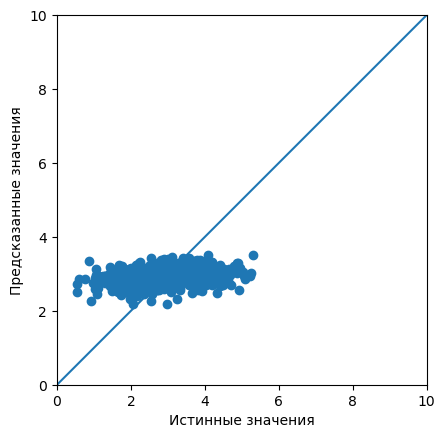

In [152]:
# предсказание на тренеровочной
test_predictions_t = model.predict(X_1_train).flatten()
a = plt.axes(aspect='equal')
plt.scatter(y_3_train, test_predictions_t)
plt.xlabel('Истинные значения')
plt.ylabel('Предсказанные значения')
lims = [0, 10]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

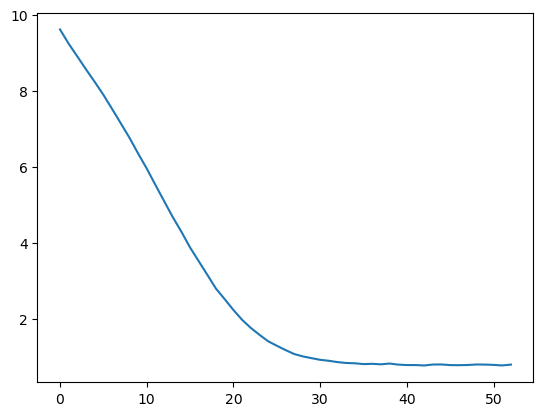

In [153]:
plt.plot(history.history['loss'])

plt.show()

In [161]:

print(f'MSE: {mean_squared_error(y_3_test, test_predictions)}')
print(f'MAE: {mean_absolute_error(y_3_test, test_predictions)}')

MSE: 0.8136327238120726
MAE: 0.7284703324184613


метрики

In [163]:
nn_mn_result = dummy_mn_result = pd.DataFrame({
   'Model': 'Нейронная сеть',
   'MSE' : mean_squared_error(y_3_test, test_predictions),
   'MAE': mean_absolute_error(y_3_test, test_predictions), 
   'R2 score': r2_score(y_3_test,test_predictions).round(3)
}, index=['Матрица-наполнитель test'])

In [165]:
nn_mn_result

,Model,MSE,MAE,R2 score
Матрица-наполнитель test,Нейронная сеть,0.813633,0.72847,-0.068


метрики на traim

In [166]:
nn_mn_t_result = dummy_mn_result = pd.DataFrame({
   'Model': 'Нейронная сеть',
   'MSE' : mean_squared_error(y_3_train, test_predictions_t),
   'MAE': mean_absolute_error(y_3_train, test_predictions_t), 
   'R2 score': r2_score(y_3_train,test_predictions_t).round(3)
}, index=['Матрица-наполнитель trein'])

In [167]:
nn_mn_t_result

,Model,MSE,MAE,R2 score
Матрица-наполнитель trein,Нейронная сеть,0.765697,0.702168,0.058


In [168]:
nn_result = pd.DataFrame()

In [170]:
nn_result = pd.concat([nn_result, nn_mn_result ])

In [171]:
#Сравнение ошибки на trein и test
nn_result

,Model,MSE,MAE,R2 score
Матрица-наполнитель trein,Нейронная сеть,0.765697,0.702168,0.058
Матрица-наполнитель test,Нейронная сеть,0.813633,0.728470,-0.068


# Сравнение результатов Нейроной сети и Базовой модели

In [195]:
dummy_mn_result = pd.DataFrame({
   'Model': 'DummyRegressor',
   'MSE' : mean_squared_error(y_3_test, dummy_regr.predict(X_1_test)),
   'MAE': mean_absolute_error(y_3_test,dummy_regr.predict(X_1_test) ), 
   'R2 score': r2_score(y_3_test,dummy_regr.predict(X_1_test)).round(3)
}, index=['Матрица-наполнитель'])

In [182]:
nn_mn_result_1 = dummy_mn_result = pd.DataFrame({
   'Model': 'Нейронная сеть',
   'MSE' : mean_squared_error(y_3_test, test_predictions),
   'MAE': mean_absolute_error(y_3_test, test_predictions), 
   'R2 score': r2_score(y_3_test,test_predictions).round(3)
}, index=['Матрица-наполнитель'])

In [192]:
nn_result_m = pd.DataFrame()

In [196]:
nn_result_m = pd.concat([nn_result_m, dummy_mn_result ])

In [193]:
nn_result_m = pd.concat([nn_result_m, nn_mn_result_1])


In [197]:
nn_result_m

,Model,MSE,MAE,R2 score
Матрица-наполнитель,Нейронная сеть,0.813633,0.728470,-0.068
Матрица-наполнитель,DummyRegressor,0.762885,0.694175,-0.002


In [500]:
#Функция для построения графика потерь модели на тренировочной и тестовой выборках
def model_loss_plot(history):
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('График потерь модели', size=12)
    plt.ylabel('Средняя абсолютная ошибка', size=12)
    plt.xlabel('Эпоха', size=12)
    plt.legend(['loss', 'val_loss'], loc='best')
    plt.show()

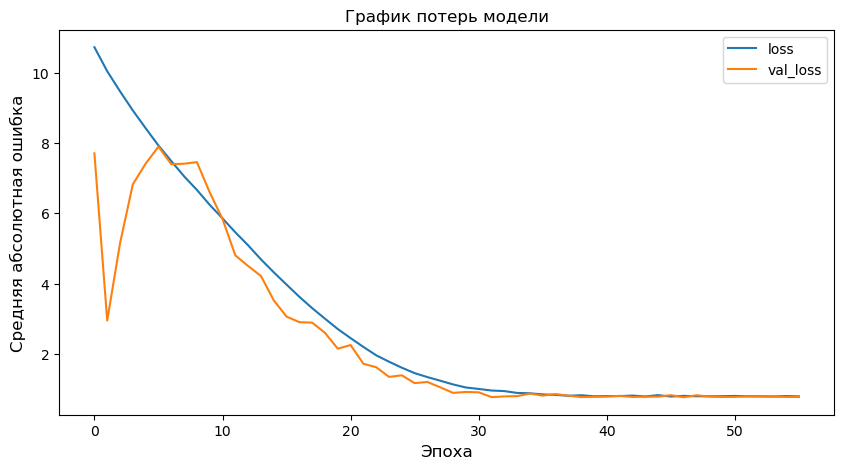

In [501]:
model_loss_plot(history)

In [502]:
#Функция для построения графика оригинального и предсказанного значения у
def actual_and_predicted_plot(original_y, predicted_y):    
    plt.figure(figsize=(10,5))
    plt.title('Тестовые и прогнозные значения', size=12)
    plt.plot(original_y, color='blue', label = 'Тестовые значения')
    plt.plot(predicted_y, color='red', label = 'Прогнозные значения')
    plt.legend(loc='best')
    plt.show()

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 500us/step


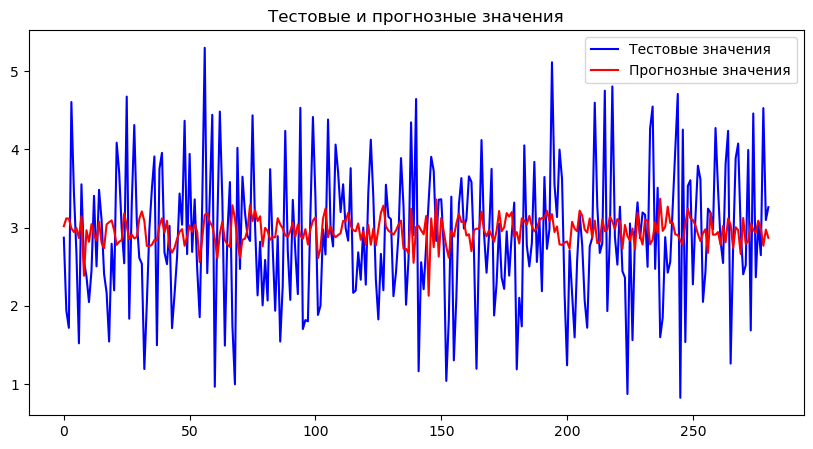

In [503]:
pred_mn = model.predict(np.array((X_1_test)))
original_mn = y_3_test.values
predicted_mn = pred_mn

actual_and_predicted_plot(original_mn, predicted_mn)

# Сохраняем модели для приложения

In [1]:
!pip install joblib

In [3]:
from joblib import dump, load

In [62]:
model_final_pr = grid_search_knn_1.best_estimator_

In [63]:
dump(model_final_pr, 'model_1.joblib')

['model_1.joblib']

In [72]:
model_final_upr = grid_search_knn_2.best_estimator_

In [73]:
dump(model_final_upr, 'model_2.joblib')

['model_2.joblib']